# Getting the Dataset

In [1]:
!pip install 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/cocodataset/cocoapi.git to /tmp/pip-req-build-hsz5_e6k
  Running command git clone --filter=blob:none --quiet https://github.com/cocodataset/cocoapi.git /tmp/pip-req-build-hsz5_e6k
  Resolved https://github.com/cocodataset/cocoapi.git to commit 8c9bcc3cf640524c4c20a9c40e89cb6a2f2fa0e9
  Preparing metadata (setup.py) ... done
  Created wheel for pycocotools: filename=pycocotools-2.0-cp310-cp310-linux_x86_64.whl size=386252 sha256=638d7f271d8cb24e43cef65abf637b1d01fd97b03d95787e96bd5cf7a0042d40
  Stored in directory: /tmp/pip-ephem-wheel-cache-002a30q6/wheels/39/61/b4/480fbddb4d3d6bc34083e7397bc6f5d1381f79acc68e9f3511
Successfully built pycocotools
  Attempting uninstall: pycocotools
    Found existing installation: pycocotools 2.0.6
    Uninstalling pycocotools-2.0.6:
      Successfully uninstalled pycocotools-2.0.6


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
!mkdir datasets
!cp /content/drive/MyDrive/images/* ./datasets/ -r

# Checking the Dataset

In [1]:
%matplotlib inline
from pycocotools.coco import COCO
import numpy as np
import skimage.io as io
import matplotlib.pyplot as plt
import pylab
import random
pylab.rcParams['figure.figsize'] = (8.0, 10.0)# Import Libraries

# For visualization
import os
import seaborn as sns
from matplotlib import colors
from tensorboard.backend.event_processing import event_accumulator as ea
from PIL import Image

In [38]:
dataDir='/content/datasets/val'
dataType='COCO_val_annos'
mul_dataType='COCO_mul_val_annos'
annFile=f'{dataDir}/{dataType}.json'
mul_annFile=f'{dataDir}/{mul_dataType}.json'
img_dir = "/content/datasets/img"

In [39]:
coco=COCO(annFile)
mul_coco=COCO(mul_annFile)

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


In [40]:
# # display categories and supercategories

# #Single Class #Damage dataset
# cats = coco.loadCats(coco.getCatIds())
# nms=[cat['name'] for cat in cats]
# print('COCO categories for damages: \n{}\n'.format(', '.join(nms)))

# nms = set([cat['supercategory'] for cat in cats])
# print('COCO supercategories for damages: \n{}\n'.format(', '.join(nms)))

# #Multi Class #Parts dataset

# mul_cats = mul_coco.loadCats(mul_coco.getCatIds())
# mul_nms=[cat['name'] for cat in mul_cats]
# print('COCO categories for parts: \n{}\n'.format(', '.join(mul_nms)))

# mul_nms = set([mul_cat['supercategory'] for mul_cat in mul_cats])
# print('COCO supercategories for parts: \n{}\n'.format(', '.join(mul_nms)))

In [41]:
catIds = coco.getCatIds(catNms=['damage']);
imgIds = coco.getImgIds(catIds=catIds );

In [42]:
random_img_id = random.choice(imgIds)
print(f"{random_img_id} image id was selected at random from the {imgIds} list")

4 image id was selected at random from the [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10] list


In [43]:
# Load the image
imgId = coco.getImgIds(imgIds = [random_img_id])
img = coco.loadImgs(imgId)[0]
print("Image details \n",img)

Image details 
 {'coco_url': '', 'date_captured': '2020-07-14 09:59:34.190485', 'file_name': '32.jpg', 'flickr_url': '', 'height': 1024, 'id': 4, 'license': 1, 'width': 1024}


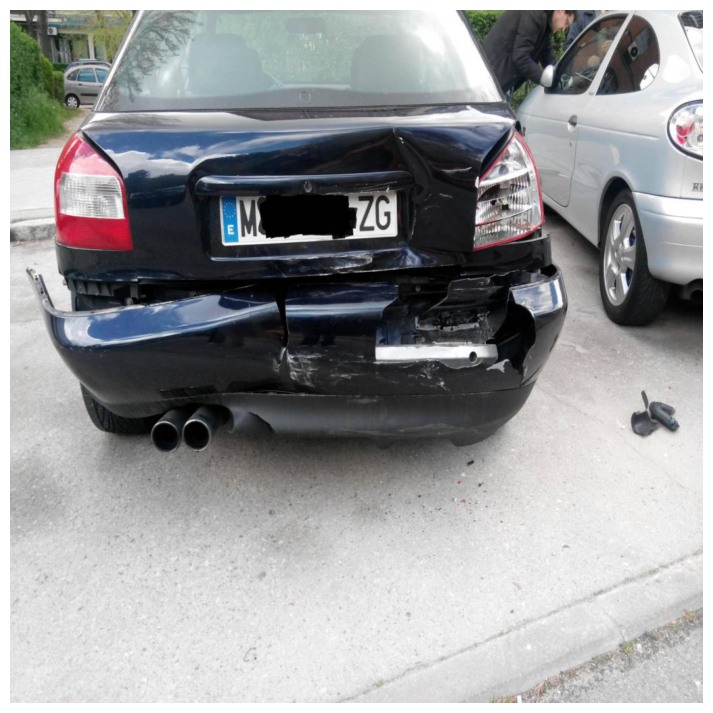

In [44]:
I = io.imread(img_dir + '/' + img['file_name'])
plt.axis('off')
plt.imshow(I)
plt.show()

In [45]:
#get damage annotations
annIds = coco.getAnnIds(imgIds=imgId,iscrowd=None)
anns = coco.loadAnns(annIds)

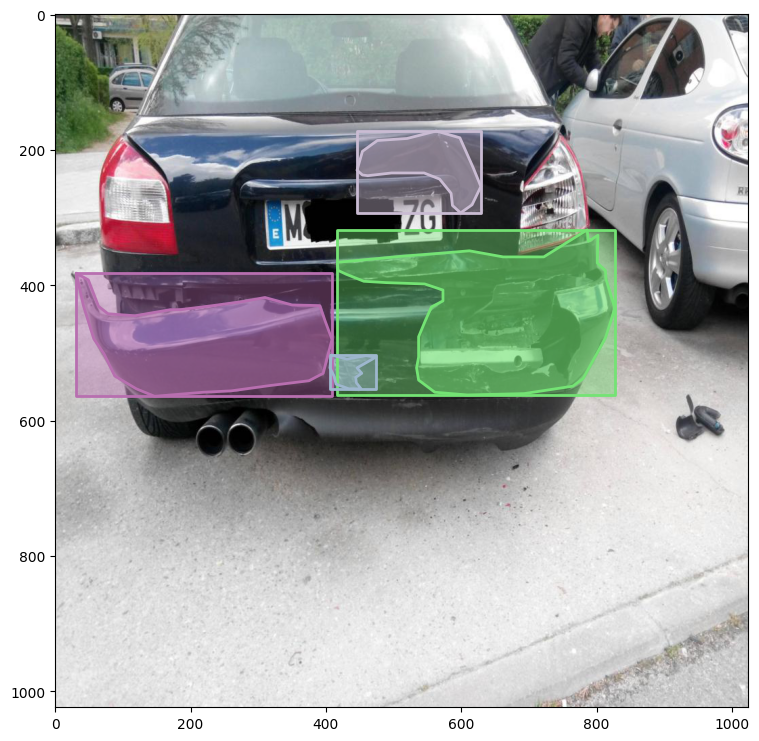

In [46]:
#Plot damages
plt.imshow(I)
plt.axis('on')
coco.showAnns(anns, draw_bbox=True )

In [47]:
#get parts annotations
mul_annIds = mul_coco.getAnnIds(imgIds=imgId,iscrowd=None)
mul_anns = mul_coco.loadAnns(mul_annIds)

In [48]:
# Create a dictionary between category_id and category name
category_map = dict()

for ele in list(mul_coco.cats.values()):
    category_map.update({ele['id']:ele['name']})

In [49]:
category_map

{1: 'headlamp', 2: 'rear_bumper', 3: 'door', 4: 'hood', 5: 'front_bumper'}

Parts are: ['headlamp', 'rear_bumper', 'headlamp']


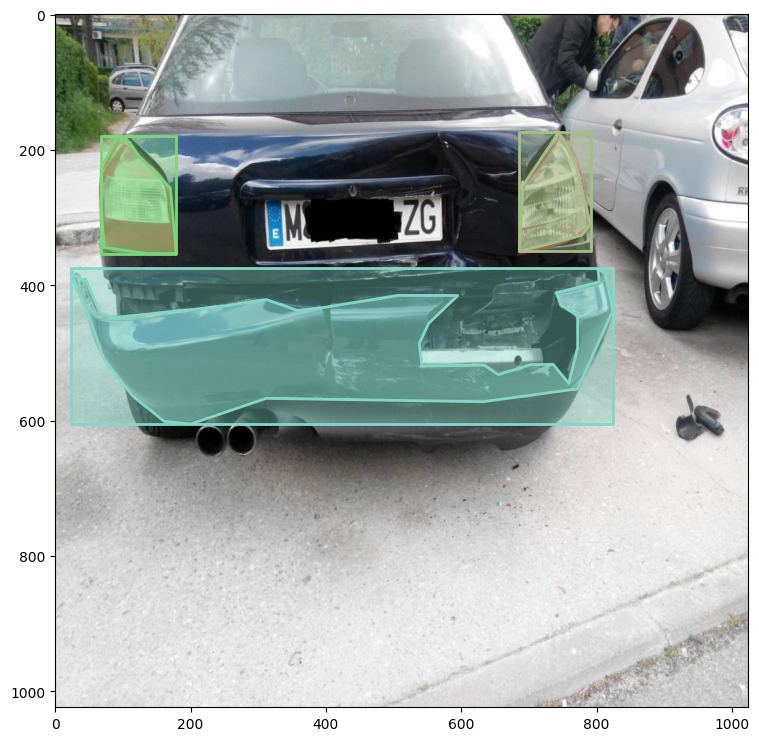

In [50]:
#Create a list of parts in the image
parts = []
for region in mul_anns:
    parts.append(category_map[region['category_id']])

print("Parts detected are:", parts) 

#Plot Parts
I = io.imread(img_dir + '/' + img['file_name'])
plt.imshow(I)
plt.axis('on')
mul_coco.showAnns(mul_anns, draw_bbox=True )

# Installing Detectron

In [19]:
!pip install -U torch torchvision
!pip install git+https://github.com/facebookresearch/fvcore.git
import torch, torchvision
torch.__version__

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/facebookresearch/fvcore.git to /tmp/pip-req-build-d1taq2vp
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/fvcore.git /tmp/pip-req-build-d1taq2vp
  Resolved https://github.com/facebookresearch/fvcore.git to commit 51092b5515cbb493f73de079743dd6b11cc4bbf1
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 2.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for fvcore: filename=fvcore-0.1.6-py3-none-any.whl size=65405 sha256=a826bc9353fea7d16852b9e3af22e172ba4c7c886bb84ea92e2699d7296661ed
  Stored in directory: /tmp/pip-ephem-wheel-cache-4anz0u5l/wheels/8f/cb/6a/3b7ac0e01781855ca3d1417ebf9e15e20d5b7fe37ab063aa50
  Created wheel for iopath: filename=

'2.0.0+cu118'

In [20]:
!git clone https://github.com/facebookresearch/detectron2 detectron2_repo
!pip install -e detectron2_repo

Cloning into 'detectron2_repo'...
remote: Enumerating objects: 15022, done.
remote: Counting objects: 100% (47/47), done.
remote: Compressing objects: 100% (30/30), done.
remote: Total 15022 (delta 23), reused 35 (delta 17), pack-reused 14975
Receiving objects: 100% (15022/15022), 6.10 MiB | 10.10 MiB/s, done.
Resolving deltas: 100% (10886/10886), done.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Obtaining file:///content/detectron2_repo
  Preparing metadata (setup.py) ... done
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 6.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 10.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 17.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

# Import Libraries required for training

In [15]:
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())

2.0.0+cu118 True


In [16]:
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
import matplotlib.pyplot as plt
import skimage.io as io

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.engine import DefaultTrainer
from detectron2.utils.visualizer import ColorMode
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

# Set base params
plt.rcParams["figure.figsize"] = [16,9]

In [17]:
!python -m detectron2.utils.collect_env

-------------------------------  -----------------------------------------------------------------
sys.platform                     linux
Python                           3.10.11 (main, Apr  5 2023, 14:15:10) [GCC 9.4.0]
numpy                            1.22.4
detectron2                       0.6 @/content/detectron2_repo/detectron2
Compiler                         GCC 9.4
CUDA compiler                    CUDA 11.8
detectron2 arch flags            7.5
DETECTRON2_ENV_MODULE            <not set>
PyTorch                          2.0.0+cu118 @/usr/local/lib/python3.10/dist-packages/torch
PyTorch debug build              False
torch._C._GLIBCXX_USE_CXX11_ABI  False
GPU available                    Yes
GPU 0                            Tesla T4 (arch=7.5)
Driver version                   525.85.12
CUDA_HOME                        /usr/local/cuda
Pillow                           8.4.0
torchvision                      0.15.1+cu118 @/usr/local/lib/python3.10/dist-packages/torchvision
torchvision

# Register Car Damage Dataset

In [22]:
dataset_dir = "/content/datasets"
img_dir = "img/"
train_dir = "train/"
val_dir = "val/"

In [23]:
from detectron2.data import DatasetCatalog
DatasetCatalog.clear()

In [24]:
from detectron2.data.datasets import register_coco_instances

# damage annotation
register_coco_instances("car_dataset_train", {}, os.path.join(dataset_dir,train_dir,"COCO_train_annos.json"), os.path.join(dataset_dir,img_dir))
register_coco_instances("car_dataset_val", {}, os.path.join(dataset_dir,val_dir,"COCO_val_annos.json"), os.path.join(dataset_dir,img_dir))


In [25]:
dataset_dicts = DatasetCatalog.get("car_dataset_train")
metadata_dicts = MetadataCatalog.get("car_dataset_train")

[05/02 11:38:36 d2.data.datasets.coco]: Loaded 59 images in COCO format from /content/datasets/train/COCO_train_annos.json


# Train Model

In [26]:
class CocoTrainer(DefaultTrainer):

  @classmethod
  def build_evaluator(cls, cfg, dataset_name, output_folder=None):

    if output_folder is None:
        os.makedirs("coco_eval", exist_ok=True)
        output_folder = "coco_eval"

    return COCOEvaluator(dataset_name, cfg, False, output_folder)

In [27]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("car_dataset_train",)
cfg.DATASETS.TEST = ("car_dataset_val",)
cfg.DATALOADER.NUM_WORKERS = 4
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml") # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.001 # pick a good LR
cfg.SOLVER.WARMUP_ITERS = 800
cfg.SOLVER.MAX_ITER = 1600 #adjust up if val mAP is still rising, adjust down if overfit
cfg.SOLVER.STEPS = (600, 1550)
cfg.SOLVER.GAMMA = 0.05
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128 # faster, and good enough for this dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1
cfg.MODEL.RETINANET.NUM_CLASSES = 1
cfg.TEST.EVAL_PERIOD = 600




# Clear any logs from previous runs
#TODO add timestamp to logs
!rm -rf cfg.OUTPUT_DIR


os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = CocoTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[05/02 11:38:53 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:561: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
model_final_f10217.pkl: 178MB [00:00, 194MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


[05/02 11:38:54 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.10/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[05/02 11:39:17 d2.utils.events]:  eta: 0:17:06  iter: 19  total_loss: 1.984  loss_cls: 0.6745  loss_box_reg: 0.2956  loss_mask: 0.6937  loss_rpn_cls: 0.2216  loss_rpn_loc: 0.02728    time: 0.6547  last_time: 0.6264  data_time: 0.0455  last_data_time: 0.0246   lr: 2.1638e-06  max_mem: 3093M
[05/02 11:39:36 d2.utils.events]:  eta: 0:17:08  iter: 39  total_loss: 2.01  loss_cls: 0.6518  loss_box_reg: 0.3863  loss_mask: 0.6926  loss_rpn_cls: 0.2033  loss_rpn_loc: 0.02565    time: 0.7375  last_time: 0.6005  data_time: 0.0257  last_data_time: 0.0250   lr: 3.3888e-06  max_mem: 3094M
[05/02 11:39:50 d2.utils.events]:  eta: 0:17:08  iter: 59  total_loss: 1.863  loss_cls: 0.6071  loss_box_reg: 0.408  loss_mask: 0.6913  loss_rpn_cls: 0.1427  loss_rpn_loc: 0.01975    time: 0.7143  last_time: 0.6683  data_time: 0.0267  last_data_time: 0.0163   lr: 4.6137e-06  max_mem: 3094M
[05/02 11:40:03 d2.utils.events]:  eta: 0:16:53  iter: 79  total_loss: 1.791  loss_cls: 0.5637  loss_box_reg: 0.3724  loss_mas

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:561: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[05/02 11:46:09 d2.evaluation.evaluator]: Inference done 11/11. Dataloading: 0.0009 s/iter. Inference: 0.1209 s/iter. Eval: 0.3675 s/iter. Total: 0.4894 s/iter. ETA=0:00:00
[05/02 11:46:09 d2.evaluation.evaluator]: Total inference time: 0:00:03.138235 (0.523039 s / iter per device, on 1 devices)
[05/02 11:46:09 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:00 (0.120926 s / iter per device, on 1 devices)
[05/02 11:46:09 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[05/02 11:46:09 d2.evaluation.coco_evaluation]: Saving results to coco_eval/coco_instances_results.json
[05/02 11:46:09 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
[05/02 11:46:09 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[05/02 11:46:09 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.02 seconds.
[05/02 11:46:09 d2.evaluation

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:561: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[05/02 11:53:15 d2.evaluation.evaluator]: Inference done 11/11. Dataloading: 0.0008 s/iter. Inference: 0.1154 s/iter. Eval: 0.2560 s/iter. Total: 0.3722 s/iter. ETA=0:00:00
[05/02 11:53:15 d2.evaluation.evaluator]: Total inference time: 0:00:02.362891 (0.393815 s / iter per device, on 1 devices)
[05/02 11:53:15 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:00 (0.115427 s / iter per device, on 1 devices)
[05/02 11:53:15 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[05/02 11:53:15 d2.evaluation.coco_evaluation]: Saving results to coco_eval/coco_instances_results.json
[05/02 11:53:15 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
[05/02 11:53:15 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[05/02 11:53:15 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.01 seconds.
[05/02 11:53:15 d2.evaluation

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:561: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[05/02 11:58:03 d2.evaluation.evaluator]: Inference done 11/11. Dataloading: 0.0009 s/iter. Inference: 0.0964 s/iter. Eval: 0.1340 s/iter. Total: 0.2312 s/iter. ETA=0:00:00
[05/02 11:58:03 d2.evaluation.evaluator]: Total inference time: 0:00:01.519621 (0.253270 s / iter per device, on 1 devices)
[05/02 11:58:03 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:00 (0.096354 s / iter per device, on 1 devices)
[05/02 11:58:03 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[05/02 11:58:03 d2.evaluation.coco_evaluation]: Saving results to coco_eval/coco_instances_results.json
[05/02 11:58:03 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
[05/02 11:58:03 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[05/02 11:58:03 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.00 seconds.
[05/02 11:58:03 d2.evaluation

In [28]:


# Look at training curves in tensorboard:
%reload_ext tensorboard
%tensorboard --logdir ./output



Output hidden; open in https://colab.research.google.com to view.

# Model Evaluation

In [29]:
evaluator = COCOEvaluator("car_dataset_val", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "car_dataset_val")
print(inference_on_dataset(trainer.model, val_loader, evaluator))

WARNING [05/02 11:58:27 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
[05/02 11:58:27 d2.data.datasets.coco]: Loaded 11 images in COCO format from /content/datasets/val/COCO_val_annos.json
[05/02 11:58:27 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[05/02 11:58:27 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[05/02 11:58:27 d2.data.common]: Serializing 11 elements to byte tensors and concatenating them all ...
[05/02 11:58:27 d2.data.common]: Serialized dataset takes 0.01 MiB
[05/02 11:58:27 d2.evaluation.evaluator]: Start inference on 11 batches


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:561: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[05/02 11:58:30 d2.evaluation.evaluator]: Inference done 11/11. Dataloading: 0.0011 s/iter. Inference: 0.0956 s/iter. Eval: 0.1439 s/iter. Total: 0.2406 s/iter. ETA=0:00:00
[05/02 11:58:30 d2.evaluation.evaluator]: Total inference time: 0:00:01.577416 (0.262903 s / iter per device, on 1 devices)
[05/02 11:58:30 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:00 (0.095599 s / iter per device, on 1 devices)
[05/02 11:58:30 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[05/02 11:58:30 d2.evaluation.coco_evaluation]: Saving results to ./output/coco_instances_results.json
[05/02 11:58:30 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
[05/02 11:58:30 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[05/02 11:58:30 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.01 seconds.
[05/02 11:58:30 d2.evaluation.

In [30]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set a custom testing threshold for this model
cfg.DATASETS.TEST = ("car_dataset_val", )
predictor = DefaultPredictor(cfg)

[05/02 11:58:37 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


In [33]:
val_dataset_dicts = DatasetCatalog.get("car_dataset_val")
val_metadata_dicts = MetadataCatalog.get("car_dataset_val")

[05/02 11:59:27 d2.data.datasets.coco]: Loaded 11 images in COCO format from /content/datasets/val/COCO_val_annos.json


Instances(num_instances=3, image_height=1024, image_width=1024, fields=[pred_boxes: Boxes(tensor([[290.1757, 171.6751, 774.3548, 370.5983],
        [ 29.5288, 198.0650, 818.1278, 628.7479],
        [ 54.0531, 376.9844, 727.6700, 618.9830]])), scores: tensor([0.9734, 0.9176, 0.7353]), pred_classes: tensor([0, 0, 0]), pred_masks: tensor([[[False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         ...,
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False]],

        [[False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         ...,
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False,

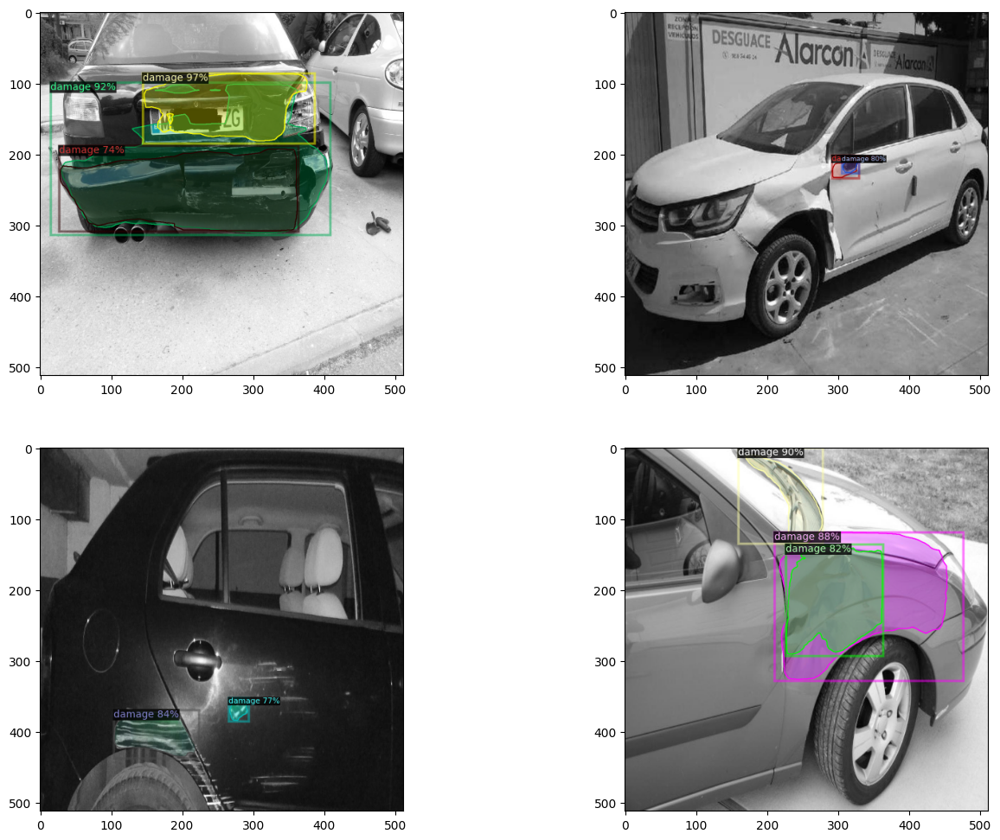

In [34]:
fig, ax = plt.subplots(2, 2, figsize =(16,12))
indices=[ax[0][0],ax[1][0],ax[0][1],ax[1][1] ]
i=-1
for d in random.sample(val_dataset_dicts, 4):
    i=i+1    
    im = io.imread(d["file_name"])
    outputs = predictor(im)
    print(outputs["instances"].to("cpu"))
    v = Visualizer(im[:, :, ::-1],
                   metadata=val_metadata_dicts, 
                   scale=0.5, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    indices[i].grid(False)
    indices[i].imshow(out.get_image()[:, :, ::-1])

In [ ]:
!mkdir models
!mv /content/output/model_final.pth /content/models/damage_segmentation_model.pth


In [ ]:
# Copying final model to Drive
# !cp models /content/drive/MyDrive -r